In [3]:
import os
import math
import dill
from itertools import permutations

import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
from matplotlib import gridspec
from sklearn.linear_model import HuberRegressor as hubreg
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
from pingouin import mixed_anova, anova, pairwise_tukey
import pingouin as pg
from statsmodels.regression.mixed_linear_model import MixedLM


import suite2p as s2p

import TwoPUtils as tpu
import STX3KO_analyses as stx
from STX3KO_analyses import utilities as u

ko_mice = stx.ymaze_sess_deets.ko_mice
ctrl_mice = stx.ymaze_sess_deets.ctrl_mice

plt.rcParams['pdf.fonttype']=42
plt.rcParams['font.family'] ='sans-serif'
plt.rcParams['font.serif'] = 'Arial'


%matplotlib inline

%load_ext autoreload
%autoreload 2

/home/mplitt/mambaforge/envs/STX3/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
def plot_crossval_placecells(mice, max_sess = 6, key = 'spks'):
    fam_dict, nov_dict = {d: {d: [] for d in range(max_sess)} for d in range(max_sess)}, {d: {d: [] for d in range(max_sess)} for d in range(max_sess)}
    fam_sort_dict, nov_sort_dict = {d: [] for d in range(max_sess)}, {d: [] for d in range(max_sess)}
    fam_mu_dict, nov_mu_dict = {d: [] for d in range(max_sess)}, {d: [] for d in range(max_sess)}
    fam_std_dict, nov_std_dict = {d: [] for d in range(max_sess)}, {d: [] for d in range(max_sess)}
    for mouse in mice:
        concat_sess = u.single_mouse_concat_sessions(mouse,date_inds=np.arange(0,max_sess))
        for sort_day in range(max_sess):
            place_cell_mask = concat_sess.place_cell_info[-1*concat_sess.novel_arm]['masks'][sort_day,:] + concat_sess.place_cell_info[concat_sess.novel_arm]['masks'][sort_day,:]>0
            
            trial_mask = (concat_sess.trial_info['sess_num']==sort_day)*(concat_sess.trial_info['LR']==-1*concat_sess.novel_arm)
            trial_inds = np.arange(trial_mask.shape[0])
            trial_inds = trial_inds[trial_mask]
            fr = np.nanmean(concat_sess.trial_matrices[key][trial_inds[::2],:,:],axis=0)[:,place_cell_mask]+1E-5
            fam_mu, fam_std = fr.mean(axis=0,keepdims=True), fr.std(axis=0,keepdims=True)
            fam_mu_dict[sort_day].append(fam_mu)
            fam_std_dict[sort_day].append(fam_std)
            
            trial_mask = (concat_sess.trial_info['sess_num']==sort_day)*(concat_sess.trial_info['LR']==concat_sess.novel_arm)
            trial_inds = np.arange(trial_mask.shape[0])
            trial_inds = trial_inds[trial_mask]
            fr = np.nanmean(concat_sess.trial_matrices[key][trial_inds[::2],:,:],axis=0)[:,place_cell_mask]+1E-5
            nov_mu, nov_std = fr.mean(axis=0,keepdims=True), fr.std(axis=0,keepdims=True)
            nov_mu_dict[sort_day].append(nov_mu)
            nov_std_dict[sort_day].append(nov_std)
            
            for day in range(max_sess):
                trial_mask = (concat_sess.trial_info['sess_num']==day)*(concat_sess.trial_info['LR']==-1*concat_sess.novel_arm)
                trial_inds = np.arange(trial_mask.shape[0])
                trial_inds = trial_inds[trial_mask]
                if sort_day==day:
                    fam_sort_dict[sort_day].append(sp.stats.zscore(np.nanmean(concat_sess.trial_matrices[key][trial_inds[::2],:,:]+1E-5,axis=0)[:,place_cell_mask],axis=1))
                    trial_inds = trial_inds[1::2]
#                 fr = sp.stats.zscore(np.nanmean(concat_sess.trial_matrices['F_dff'][trial_inds,:,:],axis=0)[:,place_cell_mask],axis=1)
                fr = np.nanmean(concat_sess.trial_matrices[key][trial_inds,:,:],axis=0)[:,place_cell_mask]
                fam_dict[sort_day][day].append(fr)
                
                trial_mask = (concat_sess.trial_info['sess_num']==day)*(concat_sess.trial_info['LR']==concat_sess.novel_arm)
                trial_inds = np.arange(trial_mask.shape[0])
                trial_inds = trial_inds[trial_mask]
                if sort_day==day:
                    nov_sort_dict[sort_day].append(sp.stats.zscore(np.nanmean(concat_sess.trial_matrices[key][trial_inds[::2],:,:]+1E-5,axis=0)[:,place_cell_mask],axis=1))
                    trial_inds = trial_inds[1::2]
                fr = np.nanmean(concat_sess.trial_matrices[key][trial_inds,:,:],axis=0)[:,place_cell_mask]
                nov_dict[sort_day][day].append(fr)

    for sort_day in range(max_sess):
        fam_sort_dict[sort_day] = np.concatenate(fam_sort_dict[sort_day],axis = -1)
        nov_sort_dict[sort_day] = np.concatenate(nov_sort_dict[sort_day],axis = -1)
        
        fam_mu_dict[sort_day] = np.concatenate(fam_mu_dict[sort_day],axis = -1)
        nov_mu_dict[sort_day] = np.concatenate(nov_mu_dict[sort_day],axis = -1)
        
        fam_std_dict[sort_day] = np.concatenate(fam_std_dict[sort_day],axis = -1)
        nov_std_dict[sort_day] = np.concatenate(nov_std_dict[sort_day],axis = -1)
        
        for day in range(max_sess):
            fam_dict[sort_day][day] = np.concatenate(fam_dict[sort_day][day],axis = -1)
            nov_dict[sort_day][day] = np.concatenate(nov_dict[sort_day][day],axis = -1)

    fig_fam_fam, ax_fam_fam  = plt.subplots(max_sess,max_sess, figsize= [30,30])
    fig_fam_fam.suptitle('Familiar act, Familiar sort')
    
    fig_fam_nov, ax_fam_nov  = plt.subplots(max_sess,max_sess, figsize= [30,30])
    fig_fam_nov.suptitle('Familiar act, Novel sort')
    
    fig_nov_fam, ax_nov_fam  = plt.subplots(max_sess,max_sess, figsize= [30,30])
    fig_nov_fam.suptitle('Novel act, Familiar sort')
    
    fig_nov_nov, ax_nov_nov  = plt.subplots(max_sess,max_sess, figsize= [30,30])
    fig_nov_nov.suptitle('Novel act, Novel sort')
    for sort_day in range(max_sess):
        sort_fam  = np.argsort(np.argmax(fam_sort_dict[sort_day],axis=0))
        sort_nov  = np.argsort(np.argmax(nov_sort_dict[sort_day],axis=0))
        for day in range(max_sess):
            fam_fam = sp.stats.zscore(fam_dict[sort_day][day], axis=0) #(fam_dict[sort_day][day]-fam_mu_dict[sort_day])/fam_std_dict[sort_day]
            fam_nov = sp.stats.zscore(fam_dict[sort_day][day], axis=0) #(fam_dict[sort_day][day] - nov_mu_dict[sort_day])/nov_std_dict[sort_day]
            nov_fam = sp.stats.zscore(nov_dict[sort_day][day], axis=0) #(nov_dict[sort_day][day] - fam_mu_dict[sort_day])/fam_std_dict[sort_day]
            nov_nov = sp.stats.zscore(nov_dict[sort_day][day], axis=0) #(nov_dict[sort_day][day] - nov_mu_dict[sort_day])/nov_std_dict[sort_day]
            

            h = ax_fam_fam[sort_day, day].imshow(fam_fam[:,sort_fam].T, aspect = 'auto', vmax = 4, vmin  =0., cmap = 'pink')
            ax_fam_fam[sort_day,day].set_title(fam_fam.shape)
            plt.colorbar(h,ax=ax_fam_fam[sort_day,day])
            
            h = ax_fam_nov[sort_day, day].imshow(fam_nov[:,sort_nov].T, aspect = 'auto', vmax = 4, vmin  =0., cmap = 'pink')
            ax_fam_nov[sort_day,day].set_title(fam_nov.shape)
            plt.colorbar(h,ax=ax_fam_nov[sort_day,day])
            
            h = ax_nov_fam[sort_day, day].imshow(nov_fam[:,sort_fam].T, aspect = 'auto', vmax = 4, vmin  =0., cmap = 'pink')
            ax_nov_fam[sort_day,day].set_title(nov_fam.shape)
            plt.colorbar(h,ax=ax_nov_fam[sort_day,day])
            
            h = ax_nov_nov[sort_day, day].imshow(nov_nov[:,sort_nov].T, aspect = 'auto', vmax = 4, vmin  =0., cmap = 'pink')
            ax_nov_nov[sort_day,day].set_title(nov_nov.shape)
            plt.colorbar(h,ax=ax_nov_nov[sort_day,day])
            
            
    return (fig_fam_fam, ax_fam_fam), (fig_fam_nov, ax_fam_nov), (fig_nov_fam, ax_nov_fam), (fig_nov_nov, ax_nov_nov)

/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:97: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")


28_09_2020 YMaze_LNovel


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


29_09_2020 YMaze_LNovel


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


30_09_2020 YMaze_LNovel
01_10_2020 YMaze_LNovel
02_10_2020 YMaze_LNovel
03_10_2020 YMaze_LNovel


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:97: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")


28_09_2020 YMaze_LNovel


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


29_09_2020 YMaze_LNovel


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


30_09_2020 YMaze_LNovel


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/01_10_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/01_10_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


01_10_2020 YMaze_LNovel


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/02_10_2020/YMaze_LNovel/YMaze_LNovel_001_009.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/02_10_2020/YMaze_LNovel/YMaze_LNovel_001_009.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


02_10_2020 YMaze_LNovel


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/03_10_2020/YMaze_LNovel/YMaze_LNovel_001_008.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/03_10_2020/YMaze_LNovel/YMaze_LNovel_001_008.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


03_10_2020 YMaze_LNovel


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:97: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")


28_09_2020 YMaze_LNovel


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.3/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.3/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


29_09_2020 YMaze_LNovel


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.3/30_09_2020/YMaze_LNovel/YMaze_LNovel_002_007.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.3/30_09_2020/YMaze_LNovel/YMaze_LNovel_002_007.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


30_09_2020 YMaze_LNovel
01_10_2020 YMaze_LNovel
02_10_2020 YMaze_LNovel
03_10_2020 YMaze_LNovel
28_09_2020 YMaze_LNovel
29_09_2020 YMaze_LNovel
30_09_2020 YMaze_LNovel
01_10_2020 YMaze_LNovel
02_10_2020 YMaze_LNovel
03_10_2020 YMaze_LNovel
28_09_2020 YMaze_LNovel
29_09_2020 YMaze_LNovel
30_09_2020 YMaze_LNovel
01_10_2020 YMaze_LNovel
02_10_2020 YMaze_LNovel
03_10_2020 YMaze_LNovel
18_10_2021 YMaze_LNovel
19_10_2021 YMaze_LNovel
20_10_2021 YMaze_LNovel
21_10_2021 YMaze_LNovel
22_10_2021 YMaze_LNovel
23_10_2021 YMaze_LNovel
18_10_2021 YMaze_LNovel
19_10_2021 YMaze_LNovel
20_10_2021 YMaze_LNovel
21_10_2021 YMaze_LNovel
23_10_2021 YMaze_LNovel
23_10_2021 YMaze_LNovel


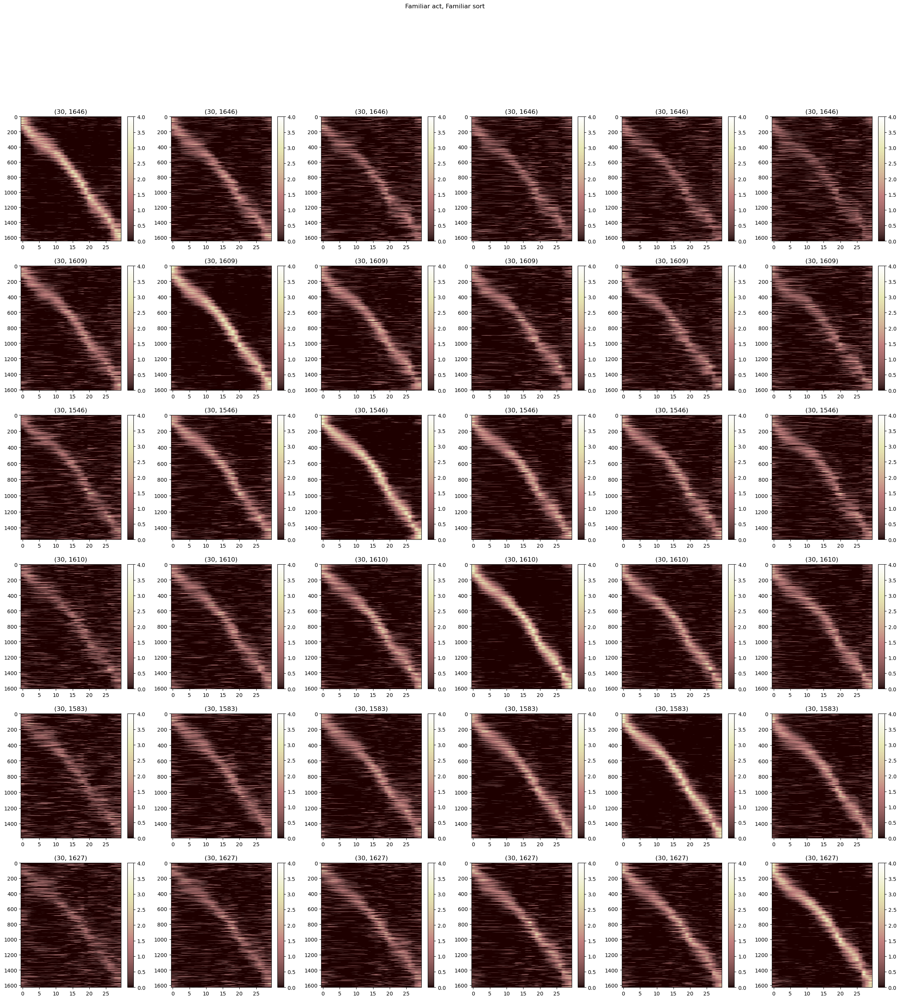

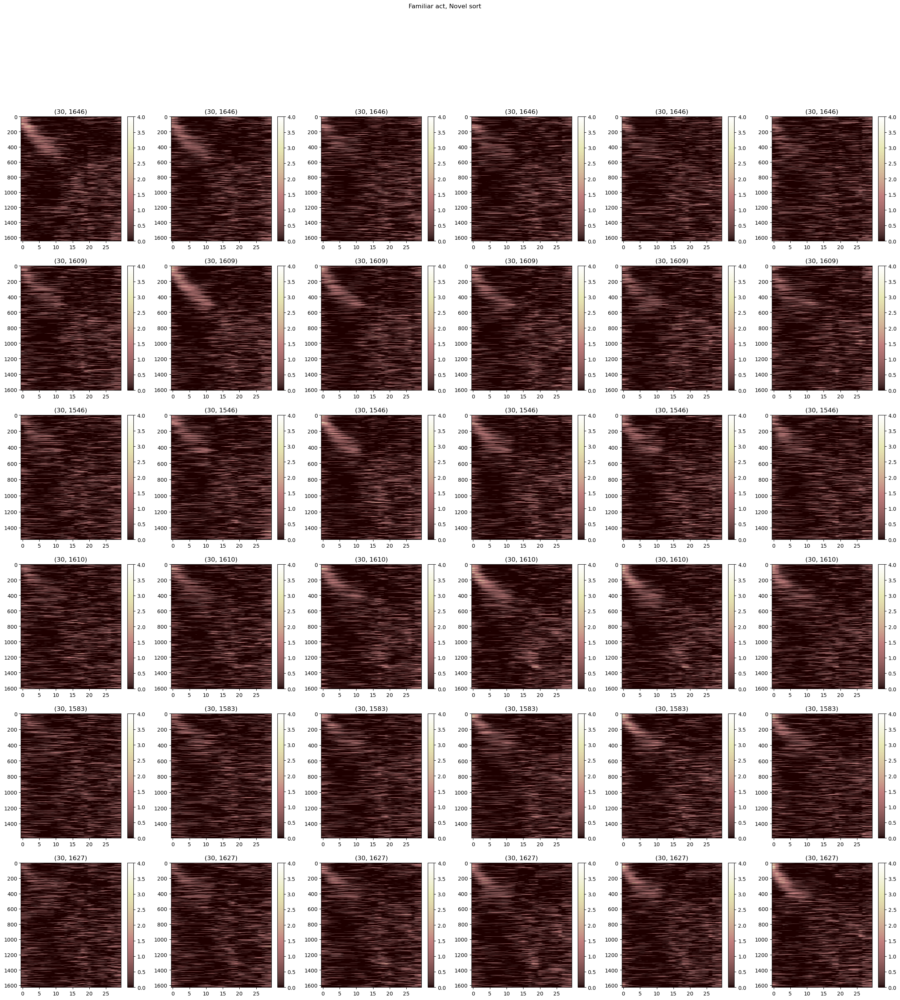

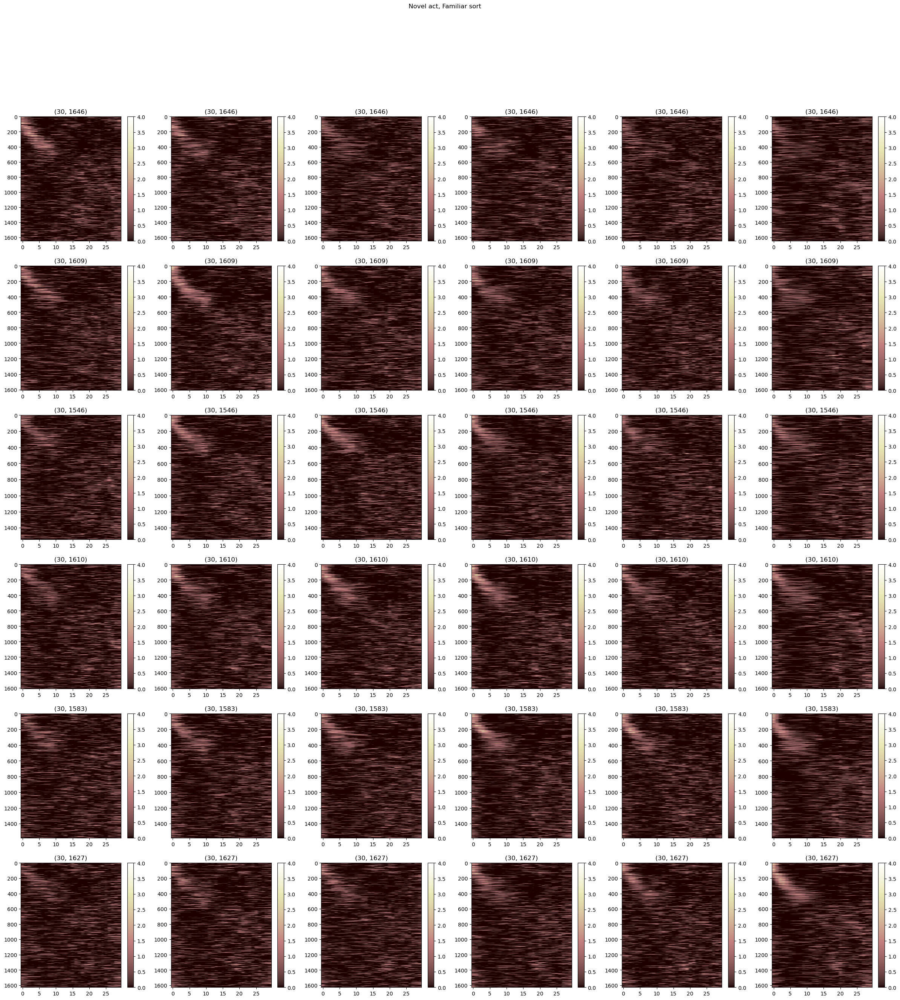

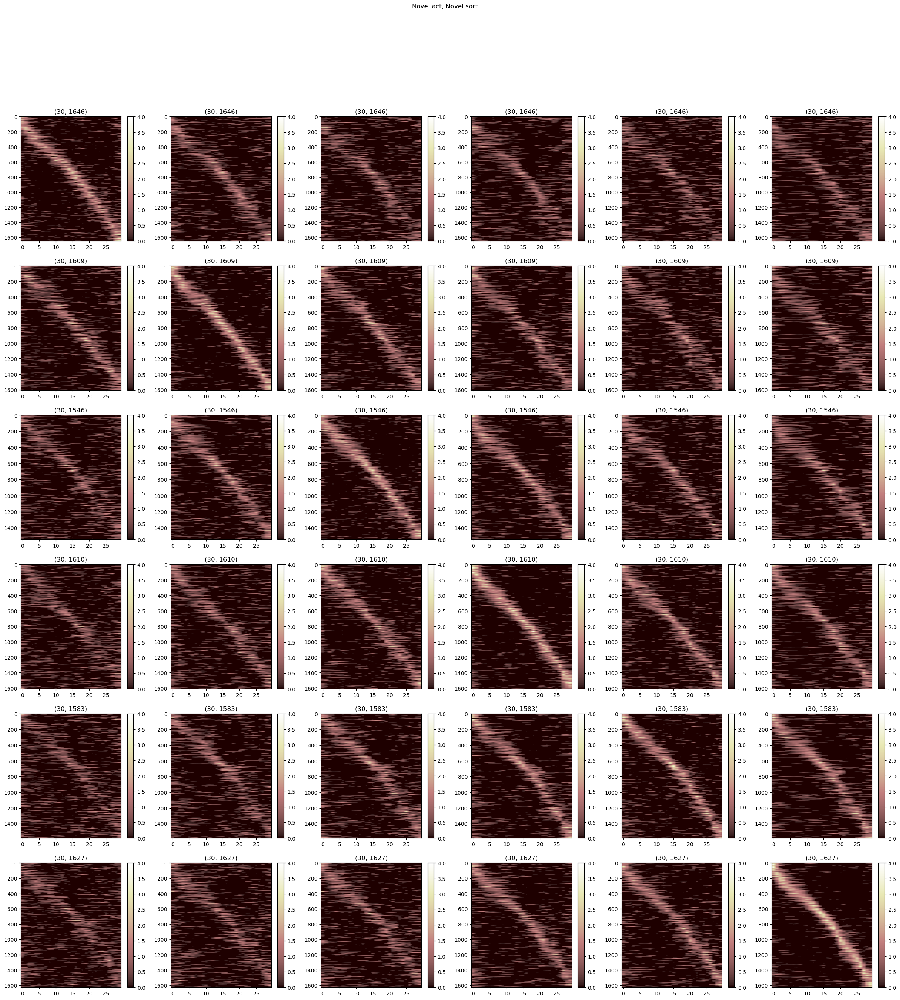

In [5]:
ff, fn, nf, nn = plot_crossval_placecells(ko_mice, max_sess=6, key = 'spks')

29_11_2020 YMaze_LNovel
30_11_2020 YMaze_LNovel
01_12_2020 YMaze_LNovel
02_12_2020 YMaze_LNovel
03_12_2020 YMaze_LNovel
04_12_2020 YMaze_LNovel
29_11_2020 YMaze_LNovel
30_11_2020 YMaze_LNovel
01_12_2020 YMaze_LNovel
02_12_2020 YMaze_LNovel
02_12_2020 YMaze_LNovel
03_12_2020 YMaze_LNovel
04_12_2020 YMaze_LNovel
29_11_2020 YMaze_LNovel
30_11_2020 YMaze_LNovel
01_12_2020 YMaze_LNovel
02_12_2020 YMaze_LNovel
03_12_2020 YMaze_LNovel
04_12_2020 YMaze_LNovel
29_11_2020 YMaze_LNovel
30_11_2020 YMaze_LNovel
30_11_2020 YMaze_LNovel
01_12_2020 YMaze_LNovel
02_12_2020 YMaze_LNovel
03_12_2020 YMaze_LNovel
04_12_2020 YMaze_LNovel
29_11_2020 YMaze_LNovel
30_11_2020 YMaze_LNovel
01_12_2020 YMaze_LNovel
02_12_2020 YMaze_LNovel
03_12_2020 YMaze_LNovel


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:97: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /media/mplitt/Backup Plus3/2P_Data/4467333.1/05_12_2020/YMaze_LNovel/YMaze_LNovel_001_002.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /media/mplitt/Backup Plus3/2P_Data/4467333.1/05_12_2020/YMaze_LNovel/YMaze_LNovel_001_002.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


05_12_2020 YMaze_LNovel
14_10_2021 YMaze_LNovel
15_10_2021 YMaze_LNovel
16_10_2021 YMaze_LNovel
17_10_2021 YMaze_LNovel
18_10_2021 YMaze_LNovel
19_10_2021 YMaze_LNovel
14_10_2021 YMaze_LNovel
15_10_2021 YMaze_LNovel
16_10_2021 YMaze_LNovel
17_10_2021 YMaze_LNovel
18_10_2021 YMaze_LNovel
19_10_2021 YMaze_LNovel
14_10_2021 YMaze_LNovel
15_10_2021 YMaze_LNovel
16_10_2021 YMaze_LNovel
17_10_2021 YMaze_LNovel
18_10_2021 YMaze_LNovel
20_10_2021 YMaze_LNovel
15_10_2021 YMaze_LNovel
16_10_2021 YMaze_LNovel
17_10_2021 YMaze_LNovel
19_10_2021 YMaze_LNovel
20_10_2021 YMaze_LNovel
21_10_2021 YMaze_LNovel


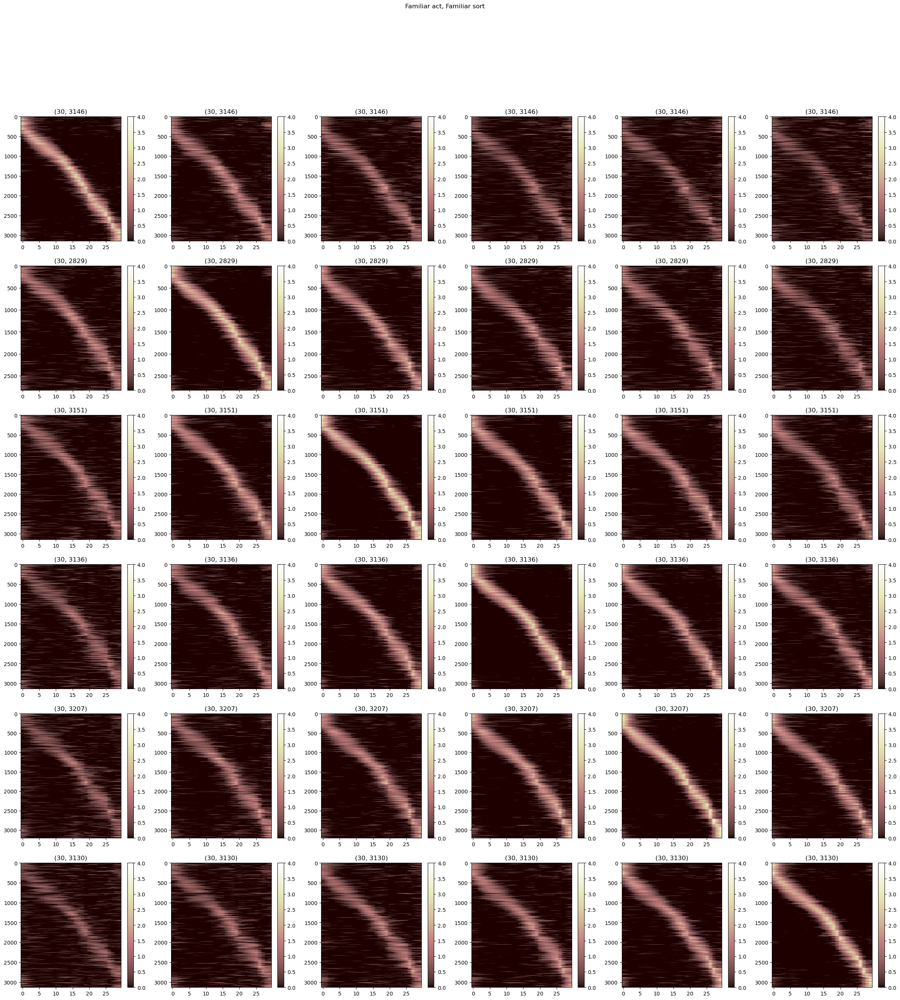

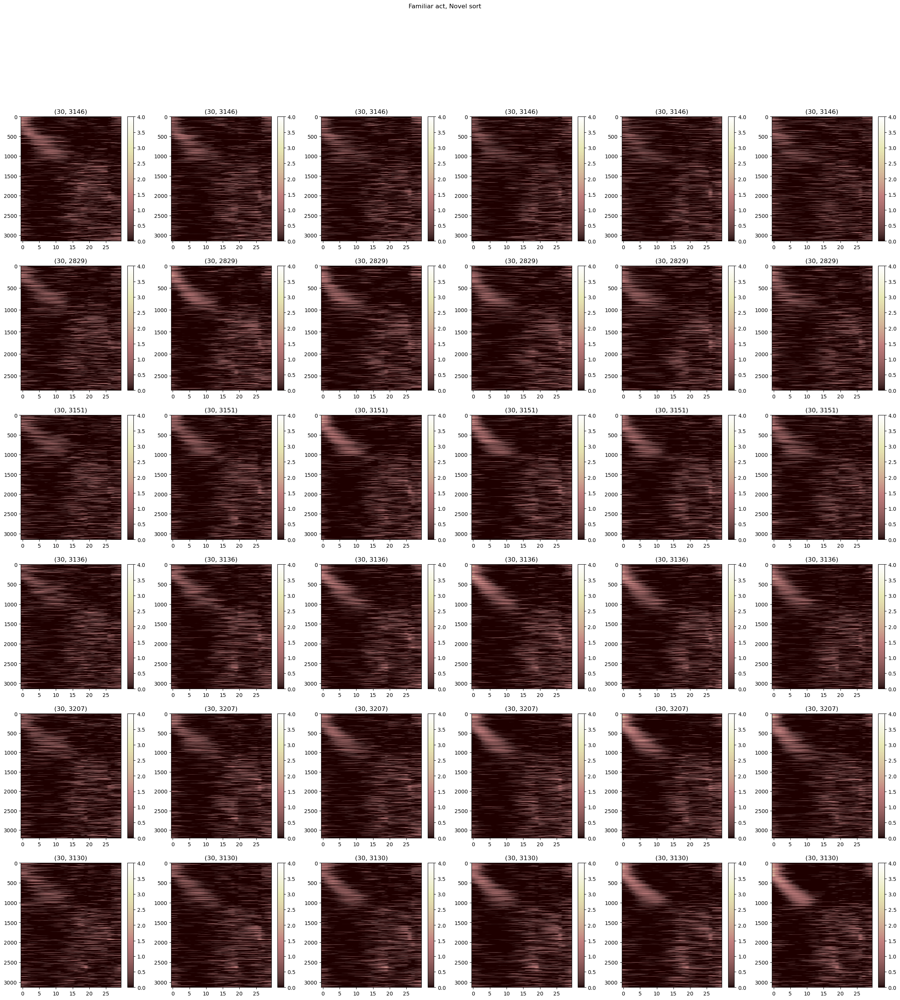

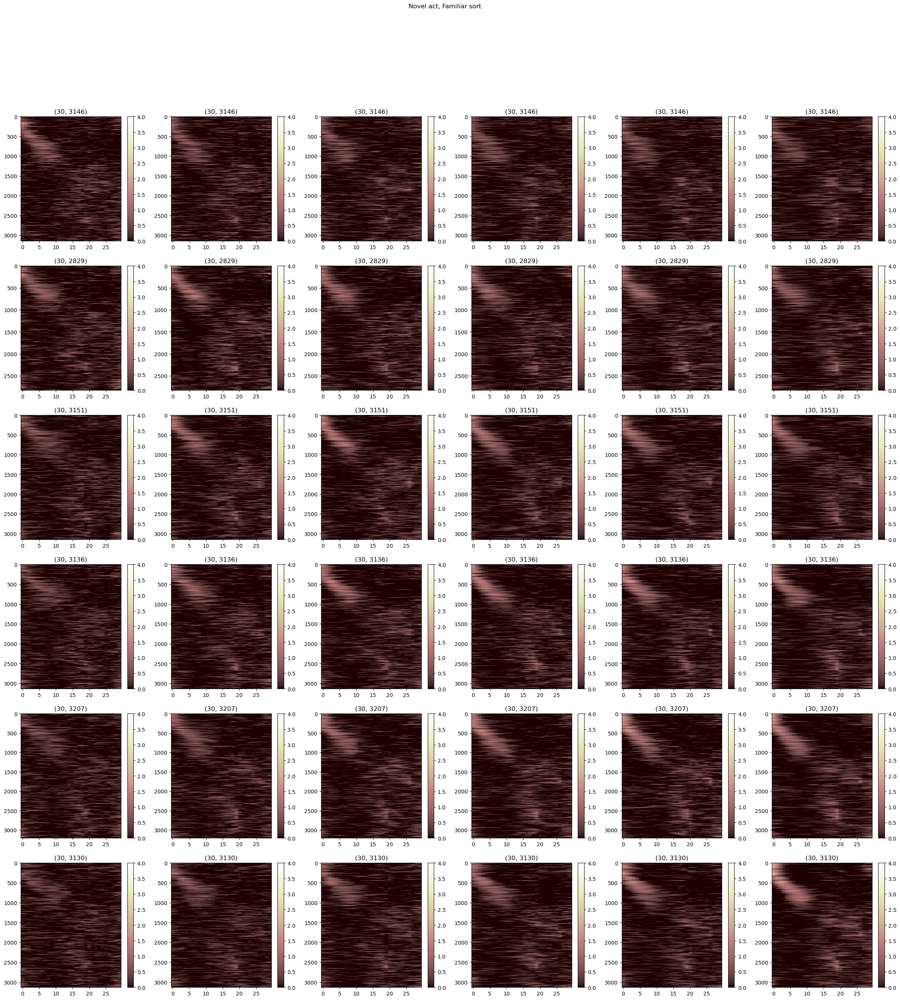

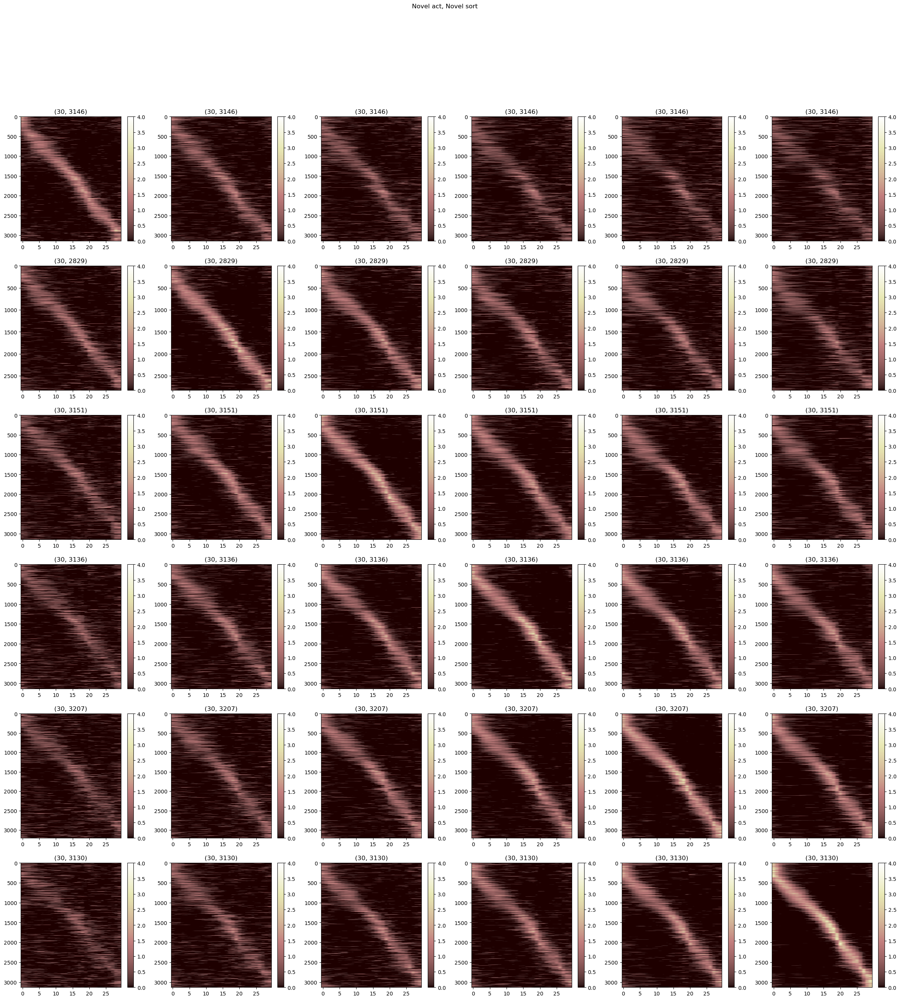

In [6]:
ff, fn, nf, nn = plot_crossval_placecells(ctrl_mice, max_sess=6, key = 'spks')